In [1]:
from dataclasses import dataclass, field
from typing import List, Dict, Tuple, Optional, Union, Any
import os
import math
import time
import tempfile
import subprocess
import numpy as np
import matplotlib.pyplot as plt
from loguru import logger
import cv2

# Types

In [2]:
@dataclass
class VideoFrame:
    """
    A dataclass representing a video frame with associated metadata.
    """
    image: np.ndarray
    time: float
    frame_number: int
    
    @property
    def time_formatted(self) -> str:
        """
        Return the time in MM:SS:mmm format (minutes:seconds:milliseconds)
        """
        minutes = int(self.time // 60)
        seconds = int(self.time % 60)
        milliseconds = int((self.time % 1) * 1000)
        
        return f"{minutes:02d}:{seconds:02d}:{milliseconds:03d}"
    
    def to_dict(self) -> Dict:
        """Convert the frame to a dictionary format."""
        return {
            'image': self.image,
            'time': self.time,
            'time_formatted': self.time_formatted,
            'frame_number': self.frame_number
        }
    
    @classmethod
    def from_dict(cls, data: Dict) -> 'VideoFrame':
        """Create a VideoFrame from a dictionary."""
        return cls(data['image'], data['time'], data['frame_number'])


@dataclass
class Video:
    """
    A dataclass representing video data and metadata.
    """
    path: str
    fps: float = 0.0
    width: int = 0
    height: int = 0
    frame_count: int = 0
    duration_seconds: float = 0.0
    frames: List[VideoFrame] = field(default_factory=list)
    subtitle_region: Optional[Tuple[int, int, int, int]] = None

# Videos reader

In [3]:
class VideoReader:
    """
    Abstract class for video reading with support for multiple engines.
    """
    def __init__(self, video_path: str, engine: str = 'opencv'):
        """
        Initialize the video reader.
        
        Args:
            video_path: Path to the video file
            engine: Video processing engine ('opencv' or 'ffmpeg')
        """
        self.video_path = video_path
        self.engine = engine.lower()
        self._validate_path()
        self.video = Video(path=video_path)
        self._load_video_info()
    
    def _validate_path(self) -> None:
        """Validate that the video file exists."""
        if not os.path.exists(self.video_path):
            raise FileNotFoundError(f"Video file not found: {self.video_path}")
    
    def _load_video_info(self) -> None:
        """Load video information using the selected engine."""
        if self.engine == 'opencv':
            self._load_video_info_opencv()
        elif self.engine == 'ffmpeg':
            self._load_video_info_ffmpeg()
        else:
            raise ValueError(f"Unsupported engine: {self.engine}. Use 'opencv' or 'ffmpeg'.")
    
    def _load_video_info_opencv(self) -> None:
        """Load video information using OpenCV."""
        cap = cv2.VideoCapture(self.video_path)
        
        if not cap.isOpened():
            raise IOError(f"Could not open video: {self.video_path}")
        
        self.video.fps = cap.get(cv2.CAP_PROP_FPS)
        self.video.width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        self.video.height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        self.video.frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        self.video.duration_seconds = self.video.frame_count / self.video.fps if self.video.fps else 0
        
        cap.release()
    
    def _load_video_info_ffmpeg(self) -> None:
        """Load video information using FFmpeg."""
        cmd = [
            "ffprobe", "-v", "error", "-select_streams", "v:0",
            "-show_entries", "stream=width,height,r_frame_rate,nb_frames,duration",
            "-of", "default=noprint_wrappers=1", self.video_path
        ]
        
        try:
            output = subprocess.check_output(cmd, stderr=subprocess.STDOUT, universal_newlines=True)
            lines = output.strip().split('\n')
            info = {}
            
            for line in lines:
                if '=' in line:
                    key, value = line.split('=')
                    info[key] = value
            
            # Parse frame rate (usually in the form "24000/1001")
            fps_parts = info.get('r_frame_rate', '').split('/')
            fps = float(fps_parts[0]) / float(fps_parts[1]) if len(fps_parts) == 2 else 0
            
            self.video.fps = fps
            self.video.width = int(info.get('width', 0))
            self.video.height = int(info.get('height', 0))
            self.video.frame_count = int(info.get('nb_frames', 0))
            
            # Try to get duration from FFprobe, otherwise calculate from frame count and FPS
            if 'duration' in info:
                self.video.duration_seconds = float(info['duration'])
            else:
                self.video.duration_seconds = self.video.frame_count / fps if fps else 0
            
        except (subprocess.CalledProcessError, ValueError) as e:
            logger.info(f"Error getting video info with FFmpeg: {e}")
            # Fallback to OpenCV if FFmpeg fails
            self._load_video_info_opencv()
    
    def print_info(self) -> None:
        """Print video information."""
        logger.info(f"Video information for {os.path.basename(self.video_path)}:")
        logger.info(f"  - Dimensions: {self.video.width}x{self.video.height}")
        logger.info(f"  - FPS: {self.video.fps:.2f}")
        logger.info(f"  - Total frames: {self.video.frame_count}")
        logger.info(f"  - Duration: {self.video.duration_seconds:.2f} seconds")
        logger.info(f"  - Time per frame: {self.video.duration_seconds / self.video.frame_count:.4f} seconds")
        logger.info(f"  - Engine: {self.engine}")
    
    def extract_frame(self, position: int) -> Optional[VideoFrame]:
        """
        Extract a specific frame from the video.
        
        Args:
            position: Frame number to extract
            
        Returns:
            VideoFrame object or None if extraction fails
        """
        if self.engine == 'opencv':
            return self._extract_frame_opencv(position)
        elif self.engine == 'ffmpeg':
            return self._extract_frame_ffmpeg(position)
        else:
            raise ValueError(f"Unsupported engine: {self.engine}")
    
    def _extract_frame_opencv(self, position: int) -> Optional[VideoFrame]:
        """Extract a specific frame using OpenCV."""
        cap = cv2.VideoCapture(self.video_path)
        
        if not cap.isOpened():
            logger.info(f"Error: Could not open video {self.video_path}")
            return None
        
        # Set position
        cap.set(cv2.CAP_PROP_POS_FRAMES, position)
        
        # Read frame
        ret, frame = cap.read()
        cap.release()
        
        if not ret:
            logger.info(f"Error: Could not extract frame {position}")
            return None
        
        # Calculate accurate time based on frame position and total video duration
        if self.video.frame_count > 0:
            time_seconds = position * (self.video.duration_seconds / self.video.frame_count)
        else:
            time_seconds = position / self.video.fps if self.video.fps else 0
            
        return VideoFrame(frame, time_seconds, position)
    
    def _extract_frame_ffmpeg(self, position: int) -> Optional[VideoFrame]:
        """Extract a specific frame using FFmpeg."""
        # Calculate accurate time based on frame position and total video duration
        if self.video.frame_count > 0:
            time_seconds = position * (self.video.duration_seconds / self.video.frame_count)
        else:
            time_seconds = position / self.video.fps if self.video.fps else 0
        
        with tempfile.NamedTemporaryFile(suffix='.png', delete=False) as temp_file:
            temp_path = temp_file.name
        
        try:
            cmd = [
                "ffmpeg", "-v", "error", "-ss", str(time_seconds),
                "-i", self.video_path, "-vframes", "1",
                "-q:v", "2", temp_path
            ]
            
            subprocess.run(cmd, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            frame = cv2.imread(temp_path)
            
            if frame is None:
                logger.info(f"Error: Could not extract frame at position {position} (time {time_seconds}s)")
                return None
            
            return VideoFrame(frame, time_seconds, position)
        finally:
            if os.path.exists(temp_path):
                os.unlink(temp_path)
    
    def extract_frames(self, num_frames: int = None, target_fps: float = None, max_frames: int = None) -> List[VideoFrame]:
        """
        Extract frames from the video.
        
        Args:
            num_frames: Number of frames to extract evenly distributed throughout the video
            target_fps: Target sampling rate (frames per second)
            max_frames: Maximum number of frames to extract (None = no limit)
            
        Note:
            If num_frames is specified, it will override target_fps.
            
        Returns:
            List of VideoFrame objects
        """
        if num_frames is not None:
            frames = self._extract_evenly_distributed_frames(num_frames)
        elif self.engine == 'opencv':
            frames = self._extract_frames_opencv(target_fps, max_frames)
        elif self.engine == 'ffmpeg':
            frames = self._extract_frames_ffmpeg(target_fps, max_frames)
        else:
            raise ValueError(f"Unsupported engine: {self.engine}")
        
        # Store the frames in the video object
        self.video.frames = frames
        return frames
    
    def _extract_evenly_distributed_frames(self, num_frames: int) -> List[VideoFrame]:
        """Extract frames evenly distributed throughout the video."""
        logger.info(f"Extracting {num_frames} evenly distributed frames from: {os.path.basename(self.video_path)}")
        start_time = time.time()
        
        if self.video.frame_count <= 0:
            logger.info("Error: Video frame count is 0 or negative.")
            return []
        
        # Calculate frame positions to extract
        if num_frames == 1:
            # Get the middle frame
            frame_positions = [self.video.frame_count // 2]
        else:
            # Calculate positions for evenly distributed frames
            frame_positions = [
                int(i * (self.video.frame_count - 1) / (num_frames - 1))
                for i in range(num_frames)
            ]
        
        frames = []
        for position in frame_positions:
            frame = self.extract_frame(position)
            if frame:
                frames.append(frame)
        
        elapsed = time.time() - start_time
        logger.info(f"Extraction complete: {len(frames)} frames in {elapsed:.2f} seconds")
        return frames
    
    def _extract_frames_opencv(self, target_fps: float, max_frames: int) -> List[VideoFrame]:
        """Extract frames at regular intervals using OpenCV."""
        logger.info(f"Extracting frames with OpenCV: {os.path.basename(self.video_path)}")
        start_time = time.time()
        
        cap = cv2.VideoCapture(self.video_path)
        
        if not cap.isOpened():
            logger.info(f"Error: Could not open video {self.video_path}")
            return []
        
        video_fps = self.video.fps
        frame_interval = int(video_fps / target_fps) if target_fps else 1
        
        logger.info(f"Video FPS: {video_fps:.2f}, Sampling interval: {frame_interval} frames")
        
        frames = []
        frame_count = 0
        
        while True:
            ret, frame = cap.read()
            
            if not ret:
                break
            
            if frame_count % frame_interval == 0:
                # Calculate accurate time based on frame position and total video duration
                if self.video.frame_count > 0:
                    current_time = frame_count * (self.video.duration_seconds / self.video.frame_count)
                else:
                    current_time = frame_count / video_fps if video_fps else 0
                    
                frames.append(VideoFrame(frame, current_time, frame_count))
                
                if max_frames and len(frames) >= max_frames:
                    break
                    
                if len(frames) % 10 == 0:
                    logger.info(f"Extracted {len(frames)} frames...")
            
            frame_count += 1
        
        cap.release()
        elapsed = time.time() - start_time
        
        logger.info(f"Extraction complete: {len(frames)} frames in {elapsed:.2f} seconds")
        return frames
    
    def _extract_frames_ffmpeg(self, target_fps: float, max_frames: int) -> List[VideoFrame]:
        """Extract frames at regular intervals using FFmpeg."""
        logger.info(f"Extracting frames with FFmpeg: {os.path.basename(self.video_path)}")
        start_time = time.time()
        
        frames = []
        
        with tempfile.TemporaryDirectory() as tmp_dir:
            # Build FFmpeg command
            output_pattern = os.path.join(tmp_dir, "frame_%04d.png")
            
            cmd = [
                "ffmpeg", "-i", self.video_path, 
                "-vf", f"fps={target_fps}", 
                "-q:v", "2"
            ]
            
            if max_frames:
                cmd.extend(["-vframes", str(max_frames)])
            
            cmd.append(output_pattern)
            
            try:
                subprocess.run(cmd, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            except subprocess.CalledProcessError as e:
                logger.info(f"FFmpeg error: {e.stderr.decode('utf-8')}")
                return []
            
            # Collect extracted frames
            frame_files = sorted([f for f in os.listdir(tmp_dir) if f.startswith("frame_")])
            
            total_frames = len(frame_files)
            for i, frame_file in enumerate(frame_files):
                frame_path = os.path.join(tmp_dir, frame_file)
                image = cv2.imread(frame_path)
                
                if image is not None:
                    # Calculate accurate time based on number of extracted frames and total duration
                    if total_frames > 1:
                        current_time = i * (self.video.duration_seconds / (total_frames - 1))
                    else:
                        current_time = 0
                        
                    frames.append(VideoFrame(image, current_time, i))
        
        elapsed = time.time() - start_time
        logger.info(f"Extraction complete: {len(frames)} frames in {elapsed:.2f} seconds")
        return frames

In [4]:
video_path = "../sandbox/sample_short.mp4"
reader = VideoReader(video_path, engine="opencv",)
reader.print_info()

2025-04-13 19:02:42.692 | INFO     | __main__:print_info:88 - Video information for sample_short.mp4:
2025-04-13 19:02:42.692 | INFO     | __main__:print_info:89 -   - Dimensions: 720x900
2025-04-13 19:02:42.692 | INFO     | __main__:print_info:90 -   - FPS: 30.00
2025-04-13 19:02:42.692 | INFO     | __main__:print_info:91 -   - Total frames: 7667
2025-04-13 19:02:42.692 | INFO     | __main__:print_info:92 -   - Duration: 255.57 seconds
2025-04-13 19:02:42.692 | INFO     | __main__:print_info:93 -   - Time per frame: 0.0333 seconds
2025-04-13 19:02:42.707 | INFO     | __main__:print_info:94 -   - Engine: opencv


In [5]:
frames = reader.extract_frames(max_frames=30)

2025-04-13 19:02:42.713 | INFO     | __main__:_extract_frames_opencv:230 - Extracting frames with OpenCV: sample_short.mp4
2025-04-13 19:02:42.730 | INFO     | __main__:_extract_frames_opencv:242 - Video FPS: 30.00, Sampling interval: 1 frames
2025-04-13 19:02:42.961 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 10 frames...
2025-04-13 19:02:42.992 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 20 frames...
2025-04-13 19:02:43.023 | INFO     | __main__:_extract_frames_opencv:273 - Extraction complete: 30 frames in 0.31 seconds


In [6]:
logger.info(frames[20].time_formatted)


2025-04-13 19:02:43.048 | INFO     | __main__:<module>:1 - 00:00:666


2025-04-13 19:02:43.313 | INFO     | __main__:display_frames:30 - 8


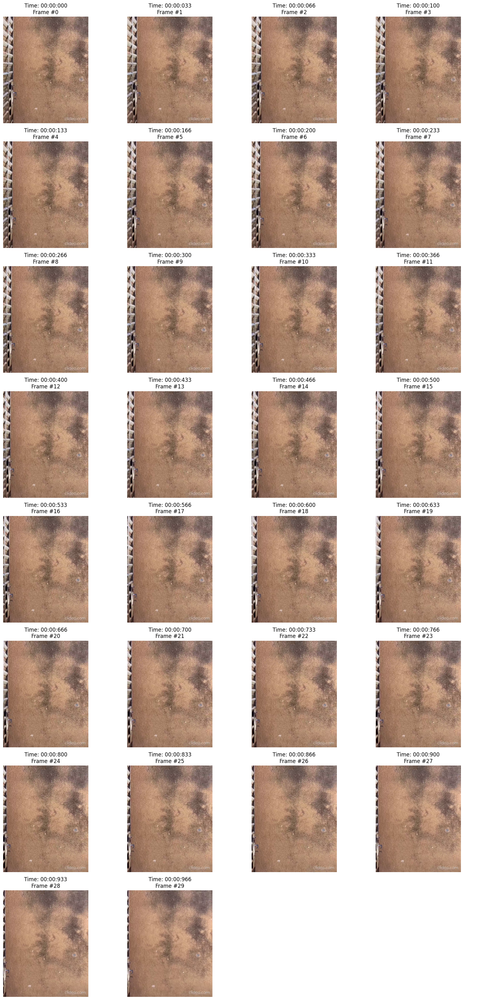

In [7]:
def display_frames(frames: List[Union[VideoFrame, Dict]], max_samples: int = 4, 
                   show_subtitle_region: bool = True, 
                   subtitle_region: Tuple[int, int, int, int] = None) -> None:
    """
    Display a sample of extracted frames, with optional subtitle region highlighting.
    
    Args:
        frames: List of VideoFrame objects or dictionaries
        max_samples: Number of frames to display
        show_subtitle_region: Whether to highlight the subtitle region
        subtitle_region: Tuple (y1, y2, x1, x2) representing the subtitle region
    """
    if not frames:
        logger.info("No frames to display")
        return
    
    std_frames = []
    for frame in frames:
        if isinstance(frame, VideoFrame):
            std_frames.append(frame.to_dict())
        elif isinstance(frame, dict) and 'image' in frame:
            std_frames.append(frame)
        else:
            continue
    
    num_images = min(len(std_frames), max_samples)
    max_columns = 4
    num_columns = min(num_images, max_columns)
    num_rows = math.ceil(num_images / max_columns)
    logger.info(num_rows)
    
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(4 * num_columns, 4 * num_rows))
    axes = np.atleast_2d(axes)
    
    for idx, frame_info in enumerate(std_frames[:max_samples]):
        row = idx // max_columns
        col = idx % max_columns
        
        frame_rgb = cv2.cvtColor(frame_info['image'], cv2.COLOR_BGR2RGB)
        
        # Draw subtitle region if requested
        if show_subtitle_region and subtitle_region:
            y1, y2, x1, x2 = subtitle_region
            frame_copy = frame_rgb.copy()
            # OpenCV uses BGR, but we're working with RGB here
            cv2.rectangle(frame_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
            axes[row, col].imshow(frame_copy)
        else:
            axes[row, col].imshow(frame_rgb)
        
        if 'time_formatted' in frame_info:
            time_text = frame_info['time_formatted']
        else:
            time_text = f"{frame_info['time']:.2f}s"
            
        title = f"Time: {time_text}\nFrame #{frame_info['frame_number']}"
        axes[row, col].set_title(title)
        axes[row, col].axis('off')
    
    # Hide unused axes
    for idx in range(num_images, num_rows * num_columns):
        row = idx // max_columns
        col = idx % max_columns
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
display_frames(frames, max_samples=30)

2025-04-13 19:02:48.312 | INFO     | __main__:_extract_frames_opencv:230 - Extracting frames with OpenCV: sample_short.mp4
2025-04-13 19:02:48.337 | INFO     | __main__:_extract_frames_opencv:242 - Video FPS: 30.00, Sampling interval: 30 frames
2025-04-13 19:02:49.308 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 10 frames...
2025-04-13 19:02:50.042 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 20 frames...
2025-04-13 19:02:50.760 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 30 frames...
2025-04-13 19:02:51.553 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 40 frames...
2025-04-13 19:02:52.550 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 50 frames...
2025-04-13 19:02:53.592 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 60 frames...
2025-04-13 19:02:55.291 | INFO     | __main__:_extract_frames_opencv:266 - Extracted 70 frames...
2025-04-13 19:02:56.928 | INFO     | __main__:_extract_frames_opencv:

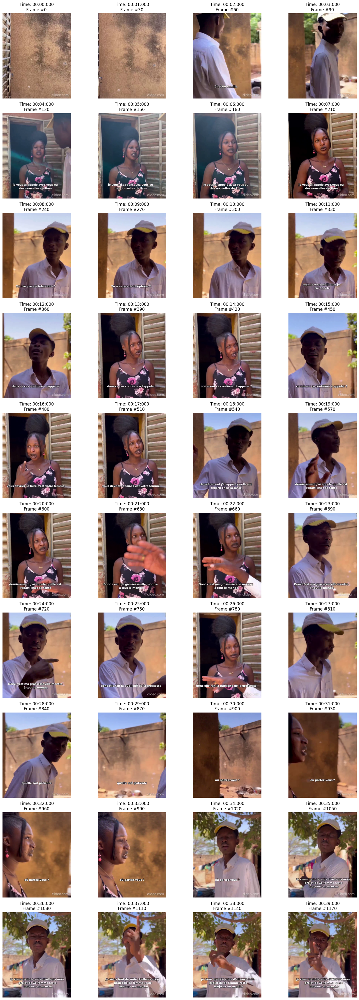

In [8]:
frames = reader.extract_frames(target_fps=1)
display_frames(frames, max_samples = 40)

In [9]:
def visualize_region_from_frames(
    self,
    region: Tuple[int, int, int, int],
    frames: List[np.ndarray],
    frame_index: int = 0
) -> None:
    """
    Visualize the detected subtitle region on a specific frame from a list.

    Args:
        region: Tuple (y1, y2, x1, x2) representing the subtitle region.
        frames: List of frames as numpy arrays (BGR format).
        frame_index: Index of the frame in the list to visualize.
    """
    if not frames or frame_index >= len(frames):
        logger.info(f"Invalid frame index {frame_index}, or empty frame list")
        return

    y1, y2, x1, x2 = region

    original_frame = frames[frame_index]
    frame_marked = original_frame.copy()

    # Draw rectangle
    cv2.rectangle(frame_marked, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Convert BGR to RGB
    original_rgb = cv2.cvtColor(original_frame, cv2.COLOR_BGR2RGB)
    marked_rgb = cv2.cvtColor(frame_marked, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    axes[0].imshow(original_rgb)
    axes[0].set_title("Original Frame")
    axes[0].axis('off')

    axes[1].imshow(marked_rgb)
    axes[1].set_title(f"Subtitle Region: y={y1}:{y2}, x={x1}:{x2}")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()


2025-04-13 19:03:16.372 | INFO     | __main__:detect_region:21 - Detecting subtitle region for sample_short.mp4
2025-04-13 19:03:16.374 | INFO     | __main__:detect_region:32 - Analyzing frames at positions: [1916, 3833, 5750]
2025-04-13 19:03:16.905 | INFO     | __main__:detect_region:53 - Detected subtitle region: y=630:900, x=36:684


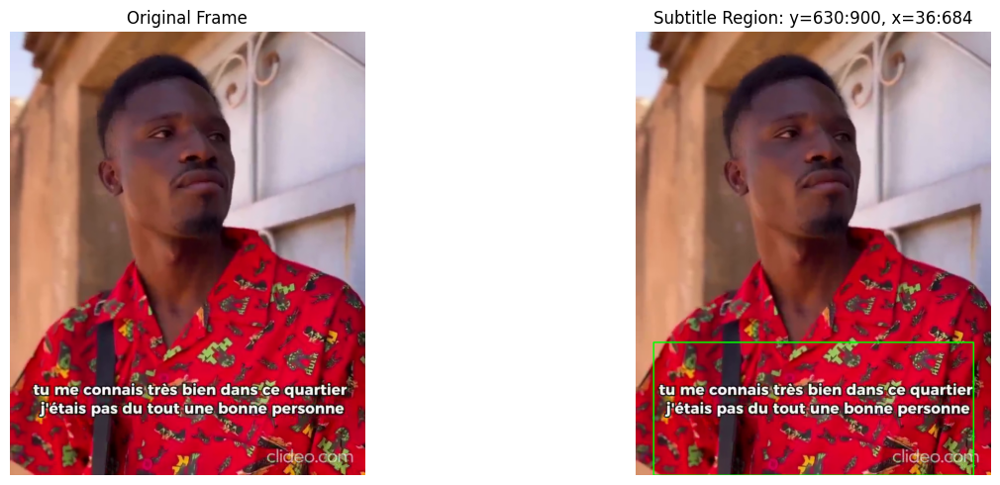

In [ ]:
class SubtitleRegionDetector:
    """
    A class for detecting the subtitle region in a video.
    """
    def __init__(self, video_reader: VideoReader):
        """
        Initialize the subtitle region detector.
        
        Args:
            video_reader: VideoReader object for the video
        """
        self.video_reader = video_reader
    
    def detect_region(self) -> Tuple[int, int, int, int]:
        """
        Detect the subtitle region in the video.
        
        Returns:
            Tuple (y1, y2, x1, x2) representing the subtitle region
        """
        logger.info(f"Detecting subtitle region for {os.path.basename(self.video_reader.video_path)}")
        
        total_frames = self.video_reader.video.frame_count
        
        # Take samples from different parts of the video
        sample_positions = [
            int(total_frames * 0.25),  
            int(total_frames * 0.5),  
            int(total_frames * 0.75),  
        ]
        
        logger.info(f"Analyzing frames at positions: {sample_positions}")
        
        frames = []
        for position in sample_positions:
            frame = self.video_reader.extract_frame(position)
            if frame:
                frames.append(frame.image)
        
        if not frames:
            logger.info("No frames could be extracted for analysis")
            return (0, 0, 0, 0)
        
        # Simple heuristic: subtitle region is often in the bottom third
        height, width = frames[0].shape[:2]
        
        y1 = int(height * 0.7)  # Start at 70% from the top
        y2 = height            # End at the bottom
        x1 = int(width * 0.05)  # Start at 5% from the left
        x2 = int(width * 0.95)  # End at 95% from the left
        
        region = (y1, y2, x1, x2)
        logger.info(f"Detected subtitle region: y={y1}:{y2}, x={x1}:{x2}")
        
        return region
    
    def visualize_region(
        self,
        region: Tuple[int, int, int, int],
        frames: List[np.ndarray],
        frame_index: int = 0
    ) -> None:
        """
        Visualize the detected subtitle region on a specific frame from a list.

        Args:
            region: Tuple (y1, y2, x1, x2) representing the subtitle region.
            frames: List of frames as numpy arrays (BGR format).
            frame_index: Index of the frame in the list to visualize.
        """
        if not frames or frame_index >= len(frames):
            logger.info(f"Invalid frame index {frame_index}, or empty frame list")
            return

        y1, y2, x1, x2 = region

        original_frame = frames[frame_index]
        frame_marked = original_frame.copy()

        # Draw rectangle
        cv2.rectangle(frame_marked, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Convert BGR to RGB
        original_rgb = cv2.cvtColor(original_frame, cv2.COLOR_BGR2RGB)
        marked_rgb = cv2.cvtColor(frame_marked, cv2.COLOR_BGR2RGB)

        fig, axes = plt.subplots(1, 2, figsize=(15, 5))

        axes[0].imshow(original_rgb)
        axes[0].set_title("Original Frame")
        axes[0].axis('off')

        axes[1].imshow(marked_rgb)
        axes[1].set_title(f"Subtitle Region: y={y1}:{y2}, x={x1}:{x2}")
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()


detector = SubtitleRegionDetector(reader)
subtitle_region = detector.detect_region()
detector.visualize_region(subtitle_region, [frame.image for frame in frames] ,frame_index=60)